# Imports

In [3]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="1"

%reload_ext autoreload
%autoreload 2
%matplotlib notebook

import sys
sys.path.append('../../../third_party_repos/') # should contain fastai2
sys.path.append('../../')
sys.path.append('../../wsi_processing_pipeline/')
sys.path.append('../../wsi_processing_pipeline/tile_extraction/')
import wsi_processing_pipeline
import tile_extraction
from wsi_processing_pipeline.tile_extraction import slide, filter, tiles, util
from wsi_processing_pipeline.preprocessing.objects import ObjectManager
from wsi_processing_pipeline.preprocessing.files_getter import FilesGetter
from wsi_processing_pipeline.preprocessing.name_getter import NameGetter

import slide, filter, tiles, util
import pathlib
from pathlib import Path, PosixPath



import sklearn
import fastcore
import fastai2
from nbdev.showdoc import show_doc  # might result in a seemingly unfixable "create_config"-related error
                                    # if so, comment it out. Much of the code seems to work without it
from fastai2.vision.all import *
import pathlib
from pathlib import Path
import pretrainedmodels
from pretrainedmodels import *
import time
import scandir
from typing import Dict
import pandas as pd
import numpy as np
import os
import torch
import torchvision
from torchvision.models import *
from torchsummary import summary
from functools import partial, update_wrapper
from tqdm import tqdm_notebook as tqdm
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
import shutil
from sklearn.model_selection import StratifiedKFold, KFold
from typing import List, Callable
from PIL import Image
torch.backends.cudnn.benchmark=True

Image.MAX_IMAGE_PIXELS = 10000000000   


#sz = 512
#bs = 16

#fastai defaults
#tta_beta = 0.4 
#tta_scale = 1.35
#dropout = 0.5
#wd = 0.01

#non defaults
#wd = 0.1 not better for se_resnext50
#dropout = 0.9

seed = 19
np.random.seed(seed)


Modify the following constants according to your use-case:

In [ ]:
PNG_BASE_DATAPATH = Path('/home/Deep_Learner/private/datasets/Kranios/tiles')
PATH = Path('/home/Deep_Learner/private/Kraniopharyngeome/')
WSI_BASE_PATH = Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/')
ROIS_PATH=Path(WSI_BASE_PATH/'rois_experimenting')
MODEL_PATH_NAME = 'models'
MODEL_PATH = PATH/MODEL_PATH_NAME

# FilesGetter cls 


In [4]:
from wsi_processing_pipeline.preprocessing.files_getter import FilesGetter

First let us have a look at our folders and files within... we can use the class "FilesGetter" for that...
we can also and should look at the folders with "get_dirs_and_files" let us have a look

In [7]:
png_dirs=FilesGetter().get_dirs_and_files(path=PNG_BASE_DATAPATH, 
                                folder_name=None, 
                                suffix=None,
                                get_files=True, 
                                recursive=True, 
                                followlinks=True, 
                                match=True)


In [88]:
png_dirs

(#2217614) [Path('/home/Deep_Learner/private/datasets/Kranios/tiles/resnext101_32x8d.pkl'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel113.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel122.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel124.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel135.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel142.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel172.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.4

The function returns a fastai List type with all folders (without the hidden ones)... you may use recursive or return files 
found recursively or not... you may even specify specific folders to look for files with exact match or only if the folder name contains the name 
given to the paramter folder_name which takes a list of odlers as well....

if we specified for instance 'aCP' and 'pCP' and 'RCC' without exact lookup match this would be the result

In [89]:
list(FilesGetter().get_dirs_and_files(path=PNG_BASE_DATAPATH, 
                                folder_name=['aCP', 'RCC', 'pCP'], 
                                suffix=None,
                                get_files=False, 
                                recursive=True, 
                                followlinks=True, 
                                match=False))

/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/ipykernel_launcher.py:39: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


[Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Tumor'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1201_17_II_HE'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1201_17_II_HE/Epithel'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1201_17_II_HE/Tumor'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1260_16_Z_HE'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1260_16_Z_HE/Epithel'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1260_16_Z_HE/Tumor'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1265_17_III_HE'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1265_17_III_HE/Epithel'),
 Path('/home/Deep_Learne

ok we will now extract all '.png' WSI slides from 'aCP' and 'pCP' and 'RCC' base and 'Epithel' subfolder with exact match...

In [6]:
png_files=FilesGetter().get_dirs_and_files(path=PNG_BASE_DATAPATH, 
                                folder_name=['Epithel'], 
                                suffix='.png',
                                get_files=True, 
                                recursive=True, 
                                followlinks=True, 
                                match=True,
                                #file_regex=fr'HE' ### in additon here we have to filter out all slides which are not the HE slides 
                                                  )
png_files

/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/ipykernel_launcher.py:39: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


(#147313) [Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel113.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel122.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel124.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel135.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel142.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel172.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel178.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aC

In [93]:
len(png_files)

147313

we have a total of 147313 images within these folders (with subfolders included) 

images may have a specific slide id for identification of from which slide they where extracted from 
additionally slides derive from different patients which should be identified in order to get a train test split on the patients
which we will be identifying by a specific case id and or patient id (as sometimes a patient has followup surgery and therfore two or more case ids...)

let us now get an overview of the cases (in our case also patients) and the slides associated with them...

In order to do so... we will look at the structure of the paths of the files we already extracted 

We will be using another class for that... NameGetter() 

#  NameGetter cls

In [46]:
from wsi_processing_pipeline.preprocessing.name_getter import NameGetter

we will first use the function:"get_path_parts_and_indices"

In [95]:
NameGetter().get_path_parts_and_indices(path=png_files[0])

{0: '/',
 1: 'home',
 2: 'Deep_Learner',
 3: 'private',
 4: 'datasets',
 5: 'Kranios',
 6: 'tiles',
 7: 'aCP',
 8: 'N113_18_Z_HE',
 9: 'Epithel',
 10: 'N113_18_Z_HE - 2019-10-21 15.44.14_Epithel113.png'}

Now we will get the case id from the 7th part of the path and split that with splitter='-' and return "n_plit_returns" in terms of a list of which parts of the splits we want in this case the first two splits... we therby get the case id...
let us try that

In [98]:
NameGetter().get_name_from_path(path=png_files[0], 
                           path_parts=[8], 
                           n_split_returns=list(range(2)), 
                           splitter='_', 
                           joiner='_', 
                           unique=False, 
                           rm_correctors=None,
                           keep_split=True,
                           regex=None,                           
                           match=False)

'N113_18'

In [102]:
case_ids=NameGetter().get_name_from_path(path=list(png_files), 
                           path_parts=[8], 
                           n_split_returns=list(range(2)), 
                           splitter='_', 
                           joiner='_', 
                           unique=False, 
                           rm_correctors=None,
                           keep_split=True,
                           regex=None,                           
                           match=False)
case_ids

['N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N1

we have now for all our files the case ids associated with the files... lets see how many unique cases there are 

In [103]:
len(set(case_ids))

172

let us do the same to get the slide ids for the files

In [107]:
slide_ids=NameGetter().get_name_from_path(path=list(png_files), 
                           path_parts=[-3], 
                           n_split_returns=list(range(4)), 
                           splitter='_', 
                           joiner='_', 
                           unique=False, 
                           rm_correctors=['HE'],### strips this off if the last part is "HE" because not all slides have a latin suffix
                           keep_split=False,
                           regex=None,                           
                           match=False)
slide_ids

['N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113

In [108]:
len(set(slide_ids))

181

Finally let us get the associated labels here we have "RCC" and "pCP" and "aCP"

In [109]:
set(NameGetter().get_name_from_path(path=list(png_files), 
                           path_parts=[7], 
                           n_split_returns=list(range(1)), 
                           splitter='-', 
                           joiner='_', 
                           unique=False, 
                           rm_correctors=None,
                           keep_split=True,
                           regex=None,                           
                           match=False))


###ok we got 2 labels
###we can assocciate the files with these labels with a utility function called label_func

{'RCC', 'aCP', 'pCP'}

In [91]:
names=NameGetter().get_name_from_path(path=list(png_files), 
                           path_parts=[7], 
                           n_split_returns=list(range(1)), 
                           splitter='-', 
                           joiner='_', 
                           unique=False, 
                           rm_correctors=None,
                           keep_split=True,
                           regex=None,                           
                           match=False)
names

['aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',


In [92]:
set(names)

{'RCC', 'aCP', 'pCP'}

In [93]:
data_labels=NameGetter().label_func(  names=names,
                                       classification_labels=['aCP', 'pCP', 'RCC'], 
                                       keys=[1,4,5],
                                       return_name=False,                  
                                    )
data_labels   

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


You see here that with the label_func method you can pass optional keys and return them instead of named values
but we will name our enteties from the previous option

let us get all the files and wrap them up and associate all the parameters (ids and labels) to them and get them into a separate Object... the "NamedObject" which can be used with the "ObjectManager" which may also split these objects into a test and training set in order to plug it into the fastai Datablock api... let us see how this works...

In [35]:
from wsi_processing_pipeline.preprocessing.objects import NamedObject

We define all id and label getting functions as outlined above

In [101]:
slide_id_getter=NameGetter(path_parts=[-3], 
                     splitter='_', 
                     joiner='-',            
                     n_split_returns=list(range(4)),
                      rm_correctors=['HE']).get_name_from_path

In [102]:

case_id_getter=NameGetter(path_parts=[-3], 
                     splitter='_', 
                     joiner='-',            
                     n_split_returns=list(range(2)),
                      rm_correctors=['HE']).get_name_from_path


In [103]:
classification_labels_getter=NameGetter(path_parts=[7], 
                     splitter='_', 
                     joiner='-',            
                     n_split_returns=list(range(1)),
                      ).get_name_from_path

Now we use the "create_named_object_from_path" method to get list of named Objects

In [104]:
no=NameGetter().create_named_object_from_path(path=list(png_files), 
                                                   case_id_getter=case_id_getter, 
                                                   slide_id_getter=slide_id_getter,
                                                   classification_labels_getter=classification_labels_getter)

Patient ID has not been specified!


/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/ipykernel_launcher.py:80: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


We get a warning because we have not specified a Patient Id... in our case this is not essential becaus e the case id is sufficient... one case belongs to one patient... this is very important for the train test split!!

Let us have a look at the named objects

In [105]:
dir(no[0])

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 'case_id',
 'classification_labels',
 'create',
 'dataset_type',
 'export_dataframe',
 'is_valid',
 'path',
 'patient_id',
 'slide_id']

In [106]:
no[0].case_id  ### se how all is asscoiated with the named object!

'N113-18'

In [107]:
no[0].path

Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel113.png')

Now we can put it into the "ObjectManager"

In [108]:
om=ObjectManager(no, splitter=sklearn.model_selection.train_test_split)
### we can pass the list of objects and a splitter for subsequent train test splitting--> here sklearns train_test_split

The ObjectManager contains the NamedObjects and can split them into train and test set and asscoiates these values with the objects

In [109]:
type(om.objects[0].is_valid)###--> is still a None value

NoneType

In [110]:
om.split(test_size=0.1, train_size=None, random_state=None, shuffle=True, stratify=None)

In [111]:
om.objects[0].is_valid###--> is now a boolian whether it is validation (True) or training set (True)

True

And now we are ready to plug all into the Datablock api from Fastai2 !!! 

In [112]:
img_block=DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    #get_items=get_tuple_files,
    get_x=lambda x: x.path , 
    get_y=lambda x: x.classification_labels ,
    splitter= FuncSplitter(lambda x: x.is_valid),
    item_tfms=Resize(224),
    batch_tfms=[Normalize.from_stats(*imagenet_stats)]
)

In [113]:
dls=img_block.dataloaders(om.objects)

<IPython.core.display.Javascript object>


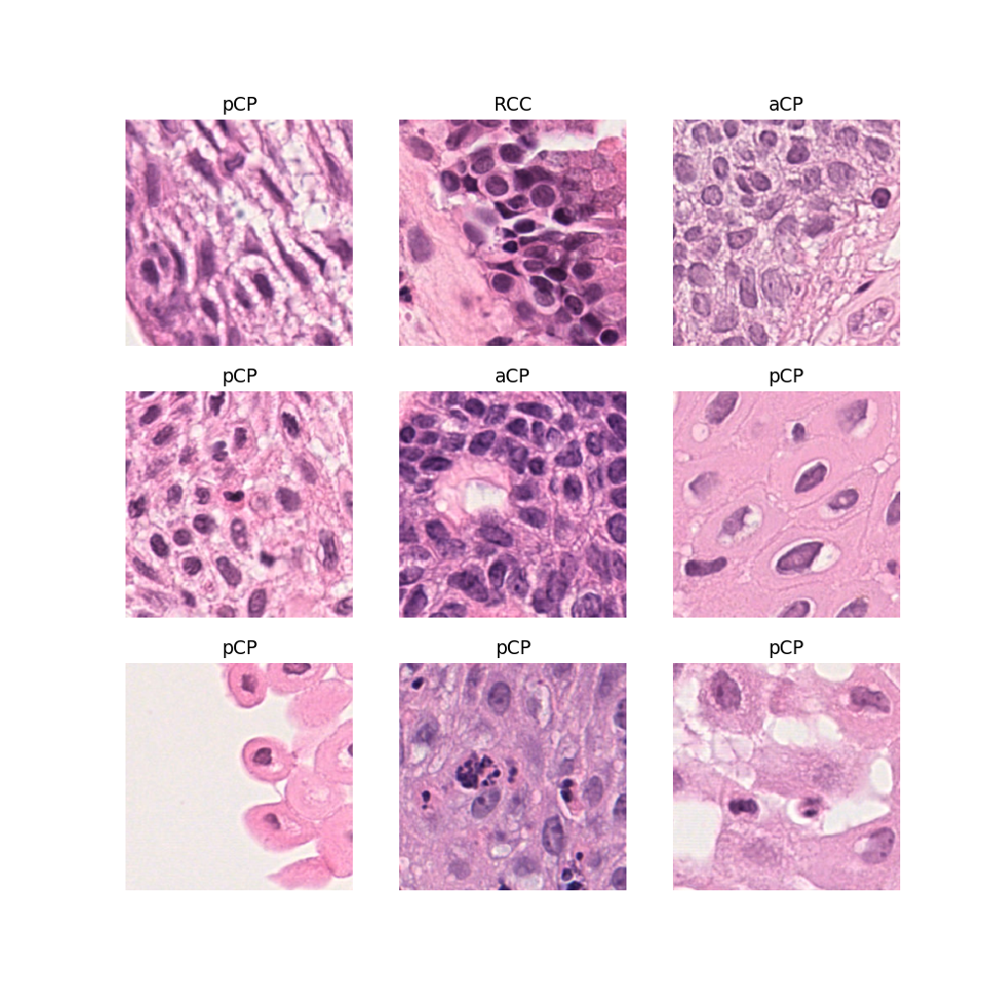

In [43]:
%matplotlib notebook
dls.show_batch()

There exists a convenience function in the ObjectMAnager to export the objects as a pandas Dataframe!

In [136]:
datfr=om.export_dataframe()

In [137]:
datfr[datfr['is_valid']==True]

,fname,labels,is_valid,patient_id,case_id,slide_id,dataset_type
3888,/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1359_17_III1_HE/Epithel/Epithel_1.png,aCP,True,None,N1359-17,N1359-17-III1,DatasetType.validation
3889,/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1359_17_III1_HE/Epithel/Epithel_10.png,aCP,True,None,N1359-17,N1359-17-III1,DatasetType.validation
3890,/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1359_17_III1_HE/Epithel/Epithel_100.png,aCP,True,None,N1359-17,N1359-17-III1,DatasetType.validation
3891,/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1359_17_III1_HE/Epithel/Epithel_101.png,aCP,True,None,N1359-17,N1359-17-III1,DatasetType.validation
3892,/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1359_17_III1_HE/Epithel/Epithel_102.png,aCP,True,None,N1359-17,N1359-17-III1,DatasetType.validation
...,...,...,...,...,...,...,...
142439,/home/Deep_Learner/private/datasets/Kranios/tiles/RCC/N459_18_II_HE/Epithel/N459_18_II_HE - 2019-10-25 12.20.04_Epithel73.png,RCC,True,None,N459-18,N459-18-II,DatasetType.validation
142440,/home/Deep_Learner/private/datasets/Kranios/tiles/RCC/N459_18_II_HE/Epithel/N459_18_II_HE - 2019-10-25 12.20.04_Epithel74.png,RCC,True,None,N459-18,N459-18-II,DatasetType.validation
142441,/home/Deep_Learner/private/datasets/Kranios/tiles/RCC/N459_18_II_HE/Epithel/N459_18_II_HE - 2019-10-25 12.20.04_Epithel75.png,RCC,True,None,N459-18,N459-18-II,DatasetType.validation
142442,/home/Deep_Learner/private/datasets/Kranios/tiles/RCC/N459_18_II_HE/Epithel/N459_18_II_HE - 2019-10-25 12.20.04_Epithel8.png,RCC,True,None,N459-18,N459-18-II,DatasetType.validation


See how easily it is plugged in in another way into the Datablock api

In [138]:
img_block=DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    #get_items=get_tuple_files,
    get_x=ColReader('fname') , 
    get_y=ColReader('labels') ,
    splitter= ColSplitter(col='is_valid'),
    item_tfms=Resize(224),
    batch_tfms=[Normalize.from_stats(*imagenet_stats)]
)

In [139]:
dls=img_block.dataloaders(datfr)

<IPython.core.display.Javascript object>


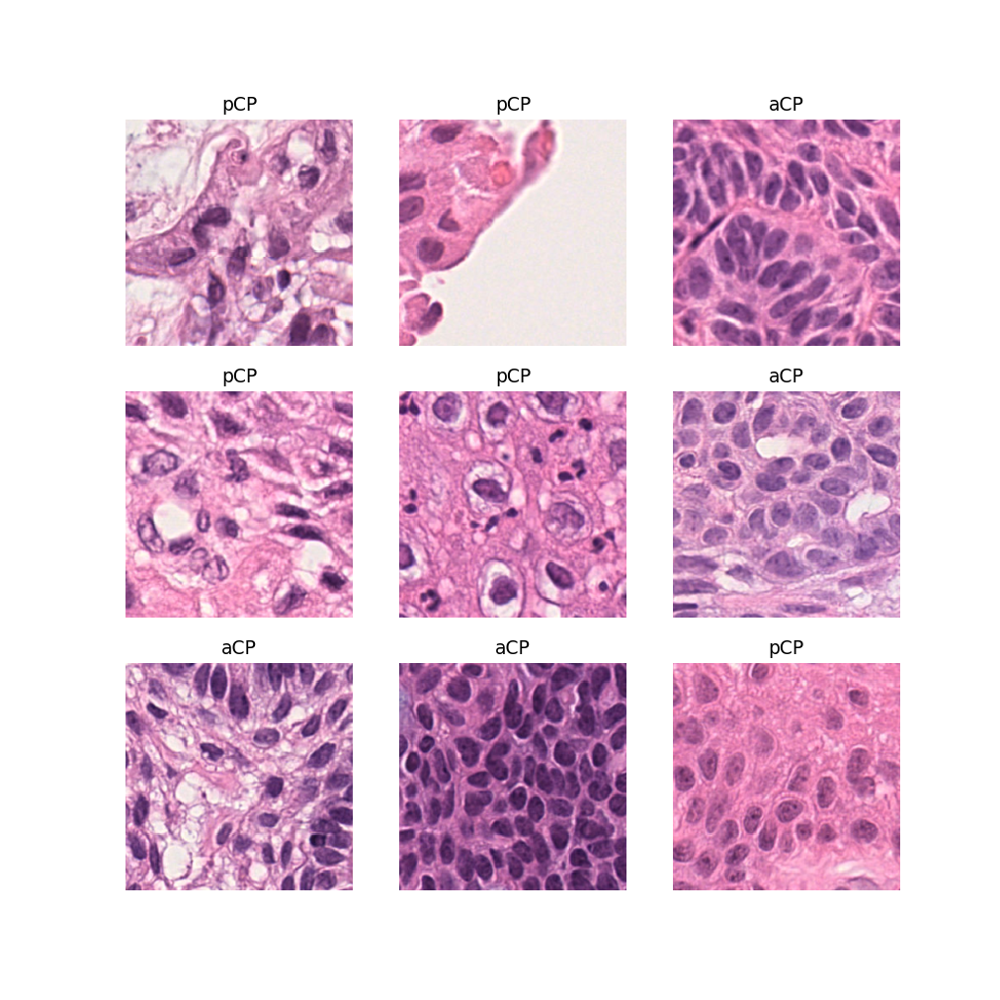

In [140]:
%matplotlib notebook
dls.show_batch()

We could now instantiate a learner and train a neuronal network... however we want to look at another option the ObjectManager manages... additionally in the dataloaders the NamedObject is gone... this is somehow impractical at some point... we will deal with that as well...

# Dealing with whole-slide images

In histopathology we do have virtual slides so called WSI objects which are like google maps images so a slide contains a very big image which is broken into small images tiles( much like the images we see above) what if we wanted to take a slide and get all the images from that slide associated so nicely like above... let us have alook the NamedObject gets extended to the WsiorRoiObject and can also be managed by the ObjectManager

In [4]:
WSI_BASE_PATH = Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/')

In [5]:
wsi_files=FilesGetter().get_dirs_and_files(path=WSI_BASE_PATH, 
                                           get_files=True, 
                                           suffix='.ndpi', 
                                           recursive=True, 
                                           folder_name=['gonadotrop', 'corticotrop'],
                                           file_regex=fr'HE')#;dirs

18it [00:16,  1.08it/s]


In [38]:
wsi_files

(#431) [Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/365-13-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/2143-15-II-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1731-16-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1840-13-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/827-18-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1825-13-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1328-15-I-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/990-17-II-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1479-16-III-HE.ndpi')...]

We have 431 slides... for this tutorial we will only be using the first 5 slides

In [6]:
wsi_files=wsi_files[:5]
wsi_files

(#5) [Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/365-13-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/2143-15-II-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1731-16-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1840-13-III-HE.ndpi')]

In [7]:
list(wsi_files)

[Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/365-13-III-HE.ndpi'),
 Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/2143-15-II-HE.ndpi'),
 Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi'),
 Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1731-16-III-HE.ndpi'),
 Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1840-13-III-HE.ndpi')]

In [8]:
NameGetter().get_path_parts_and_indices(path=wsi_files[0])

{0: '/',
 1: 'home',
 2: 'Deep_Learner',
 3: 'shared',
 4: 'Datasets',
 5: 'Hypophysenadenome',
 6: 'corticotrop',
 7: '365-13-III-HE.ndpi'}

In [9]:
wsi_case_id_getter=NameGetter(path_parts=[7], 
                     splitter='-', 
                     joiner='-',            
                     n_split_returns=list(range(2))).get_name_from_path

In [10]:
wsi_slide_id_getter=NameGetter(path_parts=[7], 
                     splitter='-', 
                     joiner='-',            
                     n_split_returns=list(range(3)),
                      rm_correctors=['HE']).get_name_from_path

In [11]:
wsi_classification_label_getter=NameGetter(path_parts=[6], 
                     splitter='-', 
                     joiner='-',            
                     n_split_returns=list(range(1))).get_name_from_path

In [12]:
now=NameGetter().create_named_object_from_path(path=list(wsi_files), 
                                                   case_id_getter=wsi_case_id_getter, 
                                                   slide_id_getter=wsi_slide_id_getter,
                                                   classification_labels_getter=wsi_classification_label_getter)

5it [00:00, 16683.79it/s]

Patient ID has not been specified!


In [13]:
now[0].path

Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/365-13-III-HE.ndpi')

In [14]:
# wsi_om=ObjectManager(now, splitter=sklearn.model_selection.train_test_split) # doesn't seem to match the parameters of ObjectManager any more
wsi_om=ObjectManager(now)

Till now everything was pretty much the same. But now we have whole slide images and we can now utilize a built in function of the ObjetManger which converts the NamedObjects into a WsiObject which has image tiles associated with it from the tile extraction part seen in tile_exctraction.

If you want to do the tile extraction part yourself you can use the method wsi_om.convert_to_wsi_or_roi_object_by_tilesummaries() which accepts a list of tile_extraction.tiles.TileSummary objects
You need to create WsiInfo objects and the tilesummaries yourself
see wsi_processing_pipeline.tile_extraction example.ipynb and https://github.com/ChristophNeuner/pituitary_gland_adenomas/blob/master/network-entity_classification_fastai2.ipynb for more information on this.
DatasetType does not need to be specified in WsiInfo for this usecase.

In [15]:
wsi_om.convert_to_wsi_or_roi_object()

100%|██████████| 5/5 [00:33<00:00,  6.79s/it]

In [16]:
wsi_om.objects[0].tiles[0].case_id

'940-13'

In [17]:
wsi_om.export_dataframe()## for convenience again a dataframe export

,fname,labels,is_valid,patient_id,case_id,slide_id,dataset_type,path
0,"[Tile #3304, Row #30, Column #56, Tissue 100.00%, Score 0.8419]",corticotrop,None,None,940-13,940-13-II,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi
1,"[Tile #3079, Row #28, Column #55, Tissue 98.44%, Score 0.8037]",corticotrop,None,None,940-13,940-13-II,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi
2,"[Tile #4751, Row #43, Column #47, Tissue 92.19%, Score 0.8029]",corticotrop,None,None,940-13,940-13-II,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi
3,"[Tile #2731, Row #25, Column #43, Tissue 93.75%, Score 0.8023]",corticotrop,None,None,940-13,940-13-II,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi
4,"[Tile #4638, Row #42, Column #46, Tissue 100.00%, Score 0.7987]",corticotrop,None,None,940-13,940-13-II,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi
...,...,...,...,...,...,...,...,...
22000,"[Tile #54528, Row #156, Column #278, Tissue 93.75%, Score 0.5501]",corticotrop,None,None,1731-16,1731-16-III,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1731-16-III-HE.ndpi
22001,"[Tile #42394, Row #122, Column #44, Tissue 98.44%, Score 0.5501]",corticotrop,None,None,1731-16,1731-16-III,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1731-16-III-HE.ndpi
22002,"[Tile #18730, Row #54, Column #180, Tissue 81.25%, Score 0.5500]",corticotrop,None,None,1731-16,1731-16-III,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1731-16-III-HE.ndpi
22003,"[Tile #59041, Row #169, Column #241, Tissue 98.44%, Score 0.5500]",corticotrop,None,None,1731-16,1731-16-III,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1731-16-III-HE.ndpi


In [18]:
# wsi_om.split(test_size=0.1, train_size=None, random_state=None, shuffle=True, stratify=None) # again, deprecated parameters
wsi_om.split(splitter=sklearn.model_selection.train_test_split)

In [19]:
wsi_om.export_dataframe()### now the is_valid and datatype parameter is set

,fname,labels,is_valid,patient_id,case_id,slide_id,dataset_type,path
0,"[Tile #3304, Row #30, Column #56, Tissue 100.00%, Score 0.8419]",corticotrop,True,None,940-13,940-13-II,DatasetType.validation,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi
1,"[Tile #3079, Row #28, Column #55, Tissue 98.44%, Score 0.8037]",corticotrop,True,None,940-13,940-13-II,DatasetType.validation,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi
2,"[Tile #4751, Row #43, Column #47, Tissue 92.19%, Score 0.8029]",corticotrop,True,None,940-13,940-13-II,DatasetType.validation,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi
3,"[Tile #2731, Row #25, Column #43, Tissue 93.75%, Score 0.8023]",corticotrop,True,None,940-13,940-13-II,DatasetType.validation,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi
4,"[Tile #4638, Row #42, Column #46, Tissue 100.00%, Score 0.7987]",corticotrop,True,None,940-13,940-13-II,DatasetType.validation,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi
...,...,...,...,...,...,...,...,...
22000,"[Tile #54528, Row #156, Column #278, Tissue 93.75%, Score 0.5501]",corticotrop,False,None,1731-16,1731-16-III,DatasetType.train,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1731-16-III-HE.ndpi
22001,"[Tile #42394, Row #122, Column #44, Tissue 98.44%, Score 0.5501]",corticotrop,False,None,1731-16,1731-16-III,DatasetType.train,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1731-16-III-HE.ndpi
22002,"[Tile #18730, Row #54, Column #180, Tissue 81.25%, Score 0.5500]",corticotrop,False,None,1731-16,1731-16-III,DatasetType.train,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1731-16-III-HE.ndpi
22003,"[Tile #59041, Row #169, Column #241, Tissue 98.44%, Score 0.5500]",corticotrop,False,None,1731-16,1731-16-III,DatasetType.train,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1731-16-III-HE.ndpi


In [20]:
wsi_om.objects[0].tiles[0].is_valid

True

# TileImage, TileTransforms, TileImageBlock

Now we are going to define some classes and functions to be able to read and display the Tiles extracted as Tile objects 
and stored in the dataframe because they are not yet displayable images like pngs....

In [21]:
from wsi_processing_pipeline.preprocessing.tile_image_block import TileImage, label_tl_image, tile_image

Let us have a look on how the function displays a Tile object

<IPython.core.display.Javascript object>


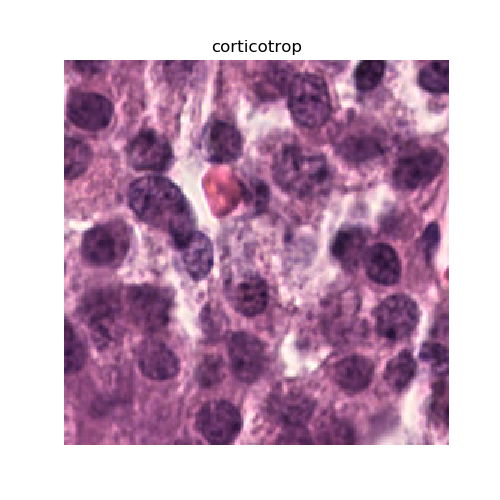

In [25]:
%matplotlib notebook
tile_image(wsi_om.get_all_top_tiles()[1000]).show()

In [26]:
from wsi_processing_pipeline.preprocessing.tile_image_block import TileTransform

We can now initialize our custom transform, we will ad the split at the validation set wwe defined earlier in our dataframe  


In [27]:
### if we had the dataframe exported....
#splits = ColSplitter('is_valid')(dataframe)
#tfm=WsiTransform(dataframe['fname'], splits=splits)
#tfm

In [28]:
splits = FuncSplitter(lambda x: x.is_valid)
tfm=TileTransform(wsi_om.get_all_top_tiles(), splits=splits)
tfm

TileTransform: (object,object) -> encodes 

a transform ca be en and decoded--> see fastai2 documentation for further info

<IPython.core.display.Javascript object>


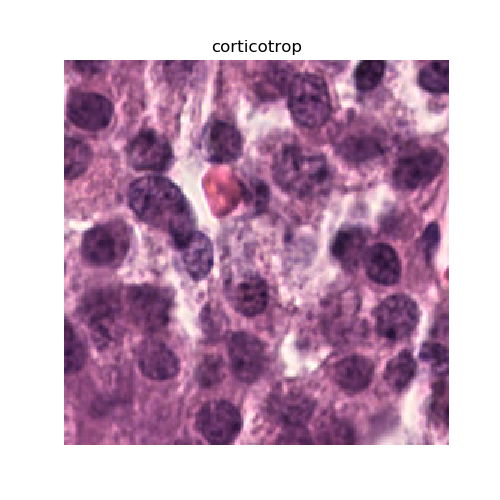

In [30]:
tfm.encodes(wsi_om.get_all_top_tiles()[1000]).show()

we can create a fastai2.data.core.Datasets object from our transforms

In [31]:
Datasets(tfm)

(#1) [(TileTransform: (object,object) -> encodes ,)]

then we create a fastai2.data.core.TfmdLists object which is a Pipeline of tfms applied to a collection of items --> see fastai2 docs

In [33]:
tls = TfmdLists(wsi_om.get_all_top_tiles(), tfm);tls

TfmdLists: [
[Tile #3304, Row #30, Column #56, Tissue 100.00%, Score 0.8419], 
[Tile #3079, Row #28, Column #55, Tissue 98.44%, Score 0.8037], 
[Tile #4751, Row #43, Column #47, Tissue 92.19%, Score 0.8029], 
[Tile #2731, Row #25, Column #43, Tissue 93.75%, Score 0.8023], 
[Tile #4638, Row #42, Column #46, Tissue 100.00%, Score 0.7987], 
[Tile #4750, Row #43, Column #46, Tissue 87.50%, Score 0.7820], 
[Tile #2395, Row #22, Column #43, Tissue 98.44%, Score 0.7815], 
[Tile #2507, Row #23, Column #43, Tissue 92.19%, Score 0.7716], 
[Tile #4752, Row #43, Column #48, Tissue 98.44%, Score 0.7709], 
[Tile #4526, Row #41, Column #46, Tissue 95.31%, Score 0.7578], 
[Tile #2730, Row #25, Column #42, Tissue 84.38%, Score 0.7553], 
[Tile #4523, Row #41, Column #43, Tissue 93.75%, Score 0.7529], 
[Tile #1840, Row #17, Column #48, Tissue 89.06%, Score 0.7455], 
[Tile #2619, Row #24, Column #43, Tissue 85.94%, Score 0.7454], 
[Tile #3305, Row #30, Column #57, Tissue 96.88%, Score 0.7441], 
[Tile #173

<IPython.core.display.Javascript object>


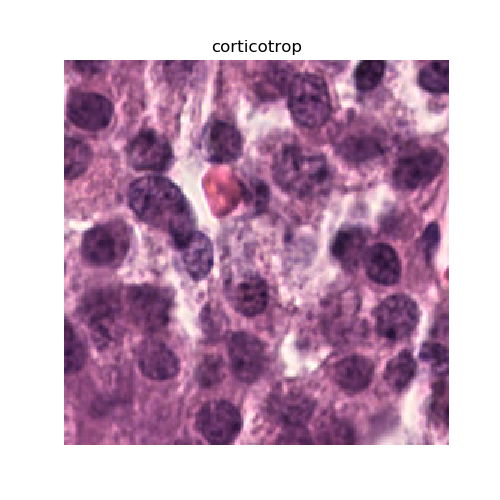

In [48]:
fastai2.data.core.show_at(tls, 1000)

finally we create a dataloaders object which can then be used with a learner

In [35]:
dls = tls.dataloaders(bs=6)

In [36]:
dls.one_batch()

(TensorImage([[[[229, 226, 232,  ..., 228, 232, 236],
           [228, 226, 234,  ..., 228, 232, 236],
           [228, 228, 237,  ..., 228, 232, 235],
           ...,
           [105, 101, 102,  ..., 116, 120, 127],
           [101, 100, 101,  ..., 124, 123, 131],
           [ 97,  98,  99,  ..., 133, 131, 138]],
 
          [[159, 156, 165,  ..., 218, 221, 223],
           [161, 159, 169,  ..., 220, 221, 223],
           [165, 164, 173,  ..., 223, 223, 225],
           ...,
           [ 53,  50,  50,  ...,  58,  58,  64],
           [ 48,  47,  47,  ...,  60,  60,  65],
           [ 44,  44,  45,  ...,  67,  65,  70]],
 
          [[193, 192, 200,  ..., 217, 215, 214],
           [194, 194, 203,  ..., 218, 215, 214],
           [196, 198, 207,  ..., 220, 216, 216],
           ...,
           [117, 107,  99,  ..., 106, 105, 109],
           [102,  99,  97,  ..., 110, 107, 111],
           [ 90,  93,  95,  ..., 115, 113, 117]]],
 
 
         [[[249, 248, 246,  ..., 234, 235, 235],
    

In order for show_batch to work we need to tell this method that it is dealing with the WsiImage we created... 
see x:WsiImage 
all is documented at the fastai2 docs

In [38]:
from wsi_processing_pipeline.preprocessing.tile_image_block import show_batch

<IPython.core.display.Javascript object>


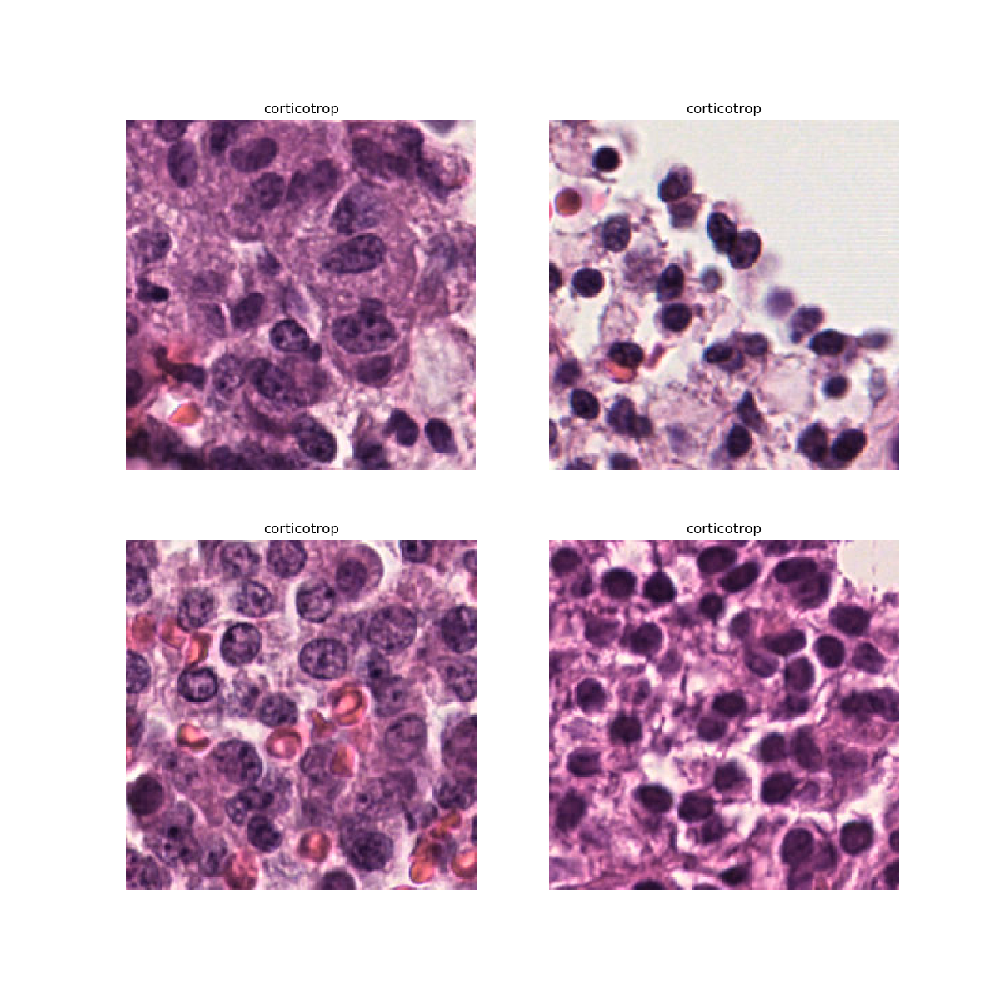

In [39]:
dls.show_batch()

again from the fastai2 docs...
working with WSI images is a very common use case, at least for us...
so it is nice to have a custom building block which can be seeminglessly used within the datablock api
this is how easy it is set up

In [41]:
from wsi_processing_pipeline.preprocessing.tile_image_block import TileImageBlock

now we put together the final datablock..
receiving data from the dataframe
and utilising our cusom building block to mangae the Tile objects
with this set up you can plug in anything you want for your datablock creation.....

In [56]:
### again if we had a dataframe...
#wsi = DataBlock(
#    blocks=(WsiImageBlock, CategoryBlock),
#    #get_items=get_tuple_files,
#    get_x=ColReader('fname'), 
#    get_y=ColReader('labels'),
#    splitter=ColSplitter('is_valid'),
#    item_tfms=Resize(224),
#    batch_tfms=[Normalize.from_stats(*imagenet_stats)]
#)


wsi = DataBlock(
    blocks=(TileImageBlock, CategoryBlock),
    #get_items=get_tuple_files,
    get_x=lambda x: x, 
    get_y=lambda x: x.classification_labels,
    splitter=FuncSplitter(lambda x: x.is_valid),
    item_tfms=Resize(224),
    batch_tfms=[Normalize.from_stats(*imagenet_stats)])

create a dataloaders for a learner

In [57]:
dls=wsi.dataloaders(wsi_om.get_all_top_tiles(), bs=6)

we can see that it automagically transforms our tile into a tensorimage and takes óur labels as category

In [84]:
b = dls.one_batch()
explode_types(b)

{tuple: [fastai2.torch_core.TensorImage, fastai2.torch_core.TensorCategory]}

The nice thing here is that show batch now works out of the box!

<IPython.core.display.Javascript object>


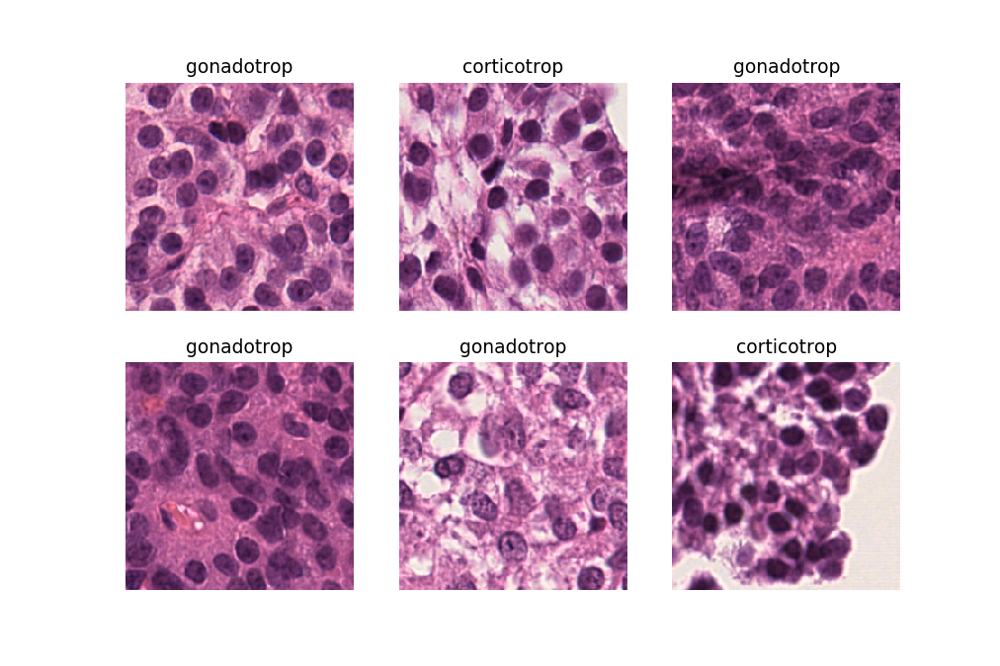

In [85]:
dls.show_batch()

One other great thing is that now the Datablock api can alos take the NamedObject as such from above...

In [114]:
png = DataBlock(
    blocks=(TileImageBlock, CategoryBlock),
    #get_items=get_tuple_files,
    get_x=lambda x: x, 
    get_y=lambda x: x.classification_labels,
    splitter=FuncSplitter(lambda x: x.is_valid),
    item_tfms=Resize(224),
    batch_tfms=[Normalize.from_stats(*imagenet_stats)]
)


In [120]:
no[0].is_valid

True

In [122]:
png_dls=png.dataloaders(om.objects, bs=6)

<IPython.core.display.Javascript object>


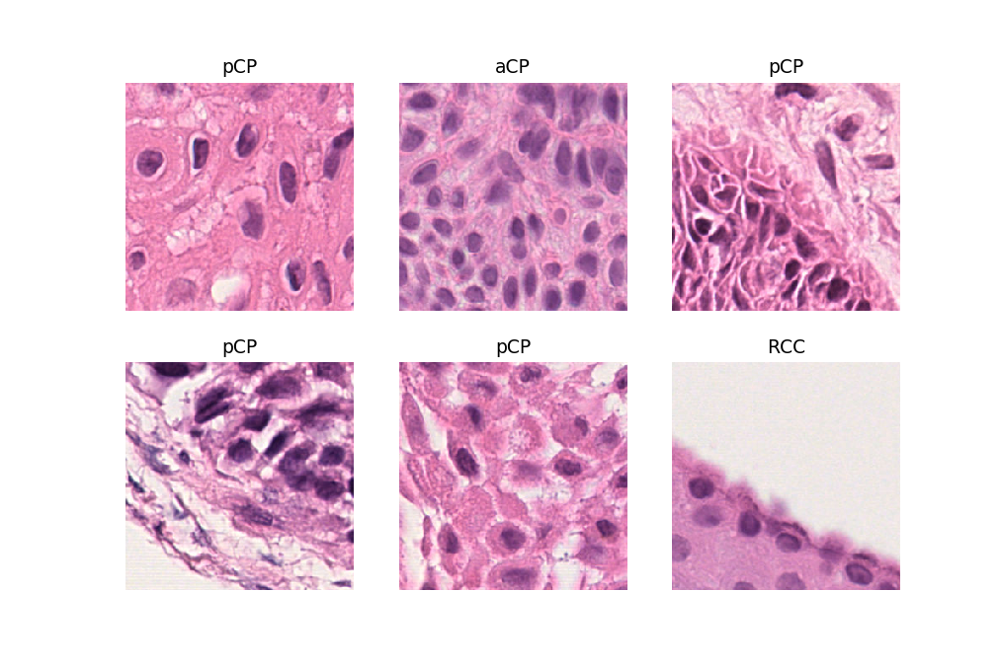

In [123]:
png_dls.show_batch()

Now let us create a learner and put everything up for training

In [134]:
epochs_frozen = 3
epochs_unfrozen = 5
arch = resnet34

sz = 512
#bs = 16

#fastai defaults
tta_beta = 0.4 
tta_scale = 1.35
dropout = 0.5
wd = 0.01

In [135]:
learner = cnn_learner(dls=png_dls, 
                     arch=arch, 
                     metrics=[accuracy, error_rate],                       
                     pretrained=True, 
                     wd = wd)

<IPython.core.display.Javascript object>


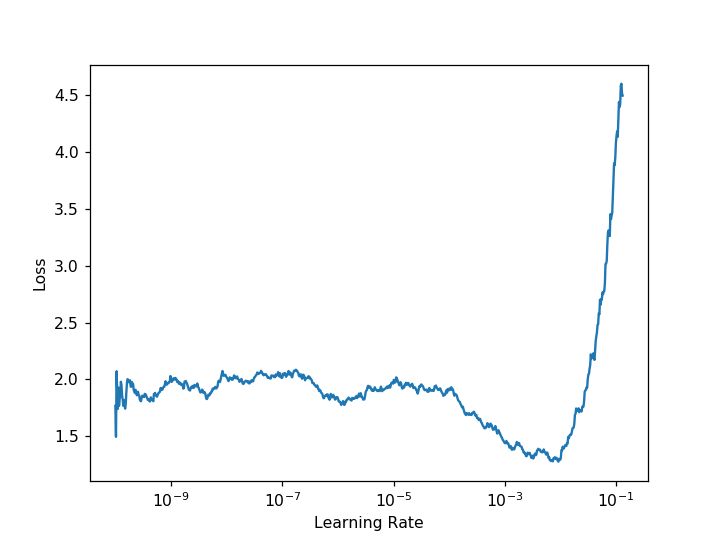

In [128]:
lr_min, lr_steep=learner.lr_find(start_lr=1e-10, end_lr=10, num_it=1000)

In [129]:
print(f"Minimum/10: {lr_min:.2e}, steepest point: {lr_steep:.2e}")

Minimum/10: 9.20e-04, steepest point: 1.25e-01


In [136]:
learner.fine_tune(epochs=epochs_frozen+epochs_unfrozen, 
                base_lr=9.20e-04, 
                freeze_epochs=epochs_frozen,
                cbs=[#SaveModelCallback(every_epoch=True, monitor='accuracy', 
                                                  # fname='bestmodel_head'), 
                                 EarlyStoppingCallback(monitor='valid_loss', comp=None, min_delta=0.1, patience=2),
                                 TerminateOnNaNCallback() ])

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.460735,1.086164,0.584730,0.415270,32:00
1,0.385039,1.070964,0.646049,0.353951,14:13
2,0.379492,0.979708,0.641793,0.358207,14:26


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.240236,1.041115,0.613860,0.386140,17:58
1,0.270805,1.405877,0.525539,0.474461,18:00
2,0.196587,0.867567,0.707236,0.292764,18:14
3,0.142442,0.995902,0.687417,0.312583,20:04
4,0.182162,0.864065,0.731312,0.268688,18:58


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5e512db560>
Traceback (most recent call last):
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 961, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 941, in _shutdown_workers
    w.join()
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5e512db560>
Traceback (most recent call last):
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 961, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 941, in _shutd

    self._shutdown_workers()
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 941, in _shutdown_workers
    w.join()
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5e512db560>
Traceback (most recent call last):
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 961, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 941, in _shutdown_workers
    w.join()
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process

No improvement since epoch 2: early stopping


<IPython.core.display.Javascript object>


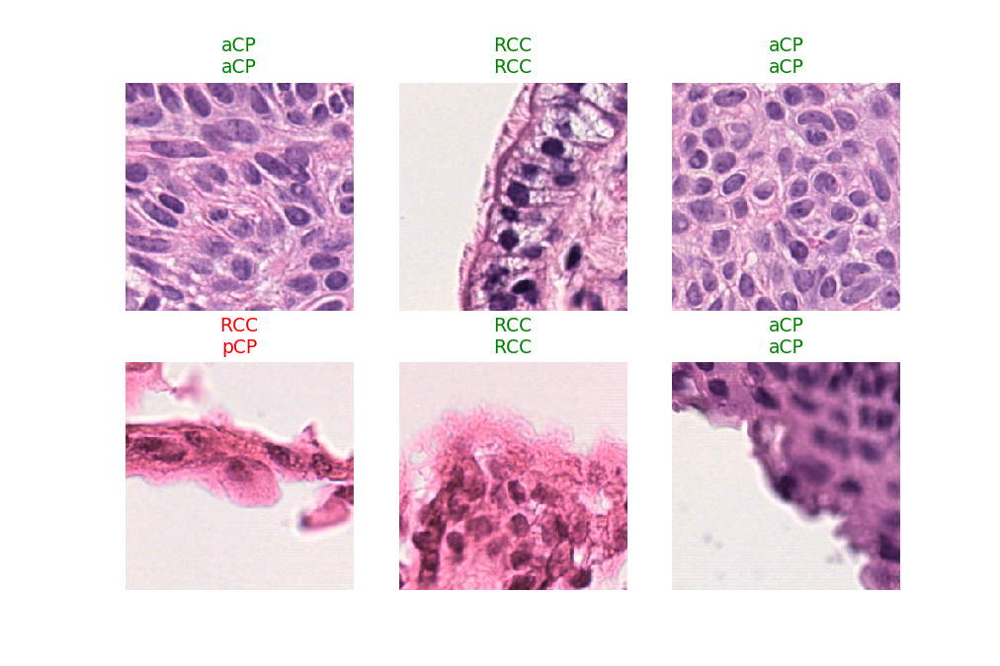

In [138]:
%matplotlib notebook
learner.show_results()

In [139]:
learner.validate()

(#3) [0.8640651106834412,0.7313115000724792,0.26868847012519836]